In [44]:
from transformers import ViTImageProcessor, ViTForImageClassification
from PIL import Image
import requests
import torch

In [57]:
MODEL_PATH = "google/vit-base-patch16-224"
url = "https://media.discordapp.net/attachments/1151568116095143946/1169974052576837723/R.jpeg"
url1 = "https://media.discordapp.net/attachments/1151568116095143946/1151569540543684688/Realartsociety_give_me_a_realistic_photo_of_someone_with_a_thum_e6667365-87e6-40cc-bd73-e90f2d5dce7f.png"

In [58]:
content = requests.get(url=url, stream=True).raw
content

In [59]:

image = Image.open(content)

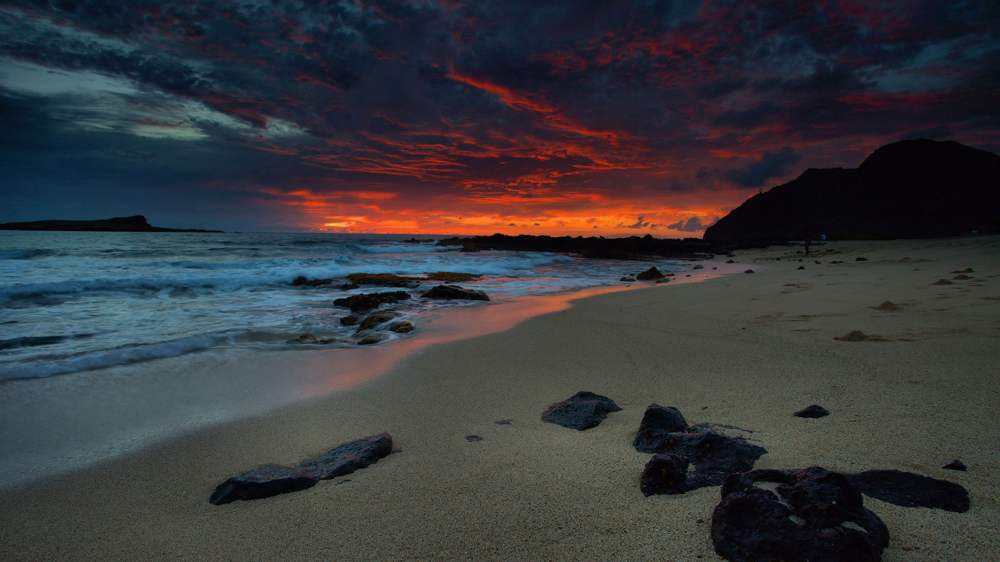

In [60]:
image

In [14]:
processor = ViTImageProcessor.from_pretrained(MODEL_PATH)
model = ViTForImageClassification.from_pretrained(MODEL_PATH)

In [61]:
inputs = processor(images=image, return_tensors="pt")

outputs = model(**inputs)

In [62]:
logits = outputs.logits

In [63]:
logits

tensor([[ 7.8100e-01,  1.6199e+00,  2.1450e+00,  2.6377e+00,  2.6729e+00,
          2.7812e+00,  3.4809e+00, -4.1861e-01,  2.1967e-02, -4.3864e-01,
          2.3920e-01, -4.5497e-01,  3.1951e-01, -1.9509e-01, -3.4536e-01,
          9.6120e-02, -5.8972e-01, -3.3969e-01,  1.0400e-01,  4.4150e-01,
          9.0837e-02, -1.4330e-01, -1.0528e-01,  9.6719e-01, -1.3327e+00,
         -4.4982e-01, -5.7459e-02, -4.0108e-01,  9.5780e-02, -4.8553e-01,
         -1.0629e-01, -7.0031e-01,  1.2777e-01,  6.4970e+00,  9.3062e+00,
          1.8741e+00,  3.1525e+00,  4.4970e-01,  4.3602e-01,  6.3780e-01,
         -8.0018e-01, -1.3597e-01,  7.5150e-01,  1.8041e-01, -1.2243e-01,
          7.0538e-01, -9.6892e-01,  5.1610e-01,  3.5737e-01,  8.6629e-01,
          1.2565e+00, -8.9109e-01, -3.8554e-01, -4.4816e-01,  7.7855e-01,
         -5.4576e-01, -7.5067e-01, -7.2412e-01,  1.2839e+00, -5.8782e-01,
          2.2852e-01, -7.7428e-01,  8.8603e-01,  3.5194e-01, -1.1437e+00,
          3.4247e+00,  1.6783e+00, -5.

In [64]:
logits.argmax(-1).item()

978

In [65]:
logits[0][419]

tensor(1.1014, grad_fn=<SelectBackward0>)

In [66]:
logits.shape

torch.Size([1, 1000])

In [67]:
softmax_values = torch.nn.functional.softmax(logits[0], dim=0)

In [68]:
softmax_values[softmax_values.argmax(-1)]

tensor(0.8292, grad_fn=<SelectBackward0>)

In [69]:
predicted_class_idx = logits.argmax(-1).item()
print("Predicted class:", model.config.id2label[predicted_class_idx])

Predicted class: seashore, coast, seacoast, sea-coast
